# Imports and settings

In [ ]:
!pip install geopandas

In [6]:
'''Importing Data Manipulation Modules'''
import numpy as np                 # Linear Algebra
import pandas as pd                # Data Processing, CSV file I/O (e.g. pd.read_csv)

'''Seaborn and Matplotlib Visualization'''
import matplotlib                  # 2D Plotting Library
import matplotlib.pyplot as plt
import seaborn as sns              # Python Data Visualization Library based on matplotlib
import geopandas as gpd            # Python Geospatial Data Library
plt.style.use('fivethirtyeight')
%matplotlib inline

'''Plotly Visualizations'''
import plotly as plotly                # Interactive Graphing Library for Python
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot, plot
init_notebook_mode(connected=True)

'''Spatial Visualizations'''
import folium
import folium.plugins

'''NLP - WordCloud'''
import wordcloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

'''Machine Learning'''
import sklearn
from sklearn import preprocessing
from sklearn import metrics
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression,LogisticRegression
from sklearn.ensemble import RandomForestRegressor,  GradientBoostingRegressor

In [4]:
df = pd.read_csv('https://raw.githubusercontent.com/jaimemv/airbnb/master/AB_NYC_2019%202.csv')

# Data exploration

In [7]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [10]:
pd.options.display.float_format = '{:.2f}'.format
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.00,48895.00,48895.00,48895.00,48895.00,48895.00,48895.00,38843.00,48895.00,48895.00
mean,19017143.24,67620010.65,40.73,-73.95,152.72,7.03,23.27,1.37,7.14,112.78
std,10983108.39,78610967.03,0.05,0.05,240.15,20.51,44.55,1.68,32.95,131.62
min,2539.00,2438.00,40.50,-74.24,0.00,1.00,0.00,0.01,1.00,0.00
25%,9471945.00,7822033.00,40.69,-73.98,69.00,1.00,1.00,0.19,1.00,0.00
50%,19677284.00,30793816.00,40.72,-73.96,106.00,3.00,5.00,0.72,1.00,45.00
75%,29152178.50,107434423.00,40.76,-73.94,175.00,5.00,24.00,2.02,2.00,227.00
max,36487245.00,274321313.00,40.91,-73.71,10000.00,1250.00,629.00,58.50,327.00,365.00


## Study Outliers

In [11]:
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

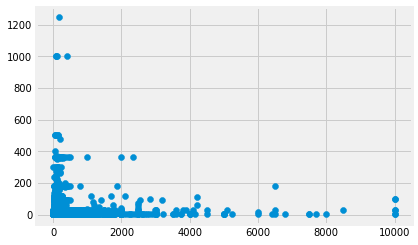

In [12]:
plt.scatter(df.price, df.minimum_nights)

## Check missing data




In [13]:
df.isna().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [14]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.65,-73.97,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75,-73.98,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.81,-73.94,Private room,150,3,0,NaN,nan,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.69,-73.96,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.80,-73.94,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


# Prepare the data
***
1. Drop pointless features
2. Impute missing data
3. Manage outliers
4. Feature encoding
5. Create features `nºdays * minimum nights`
6. Convert to categorical


***

### Drop features

In [15]:
features_drop = ['id', 'name', 'host_name', 'host_id', ]

In [16]:
df.drop(features_drop, axis=1,  inplace=True)

In [17]:
df.sample(5)

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
10003,Manhattan,Harlem,40.81,-73.96,Private room,75,14,0,NaN,nan,1,0
39577,Manhattan,East Harlem,40.82,-73.93,Entire home/apt,150,30,4,2019-05-13,1.13,1,345
41747,Manhattan,Murray Hill,40.75,-73.98,Entire home/apt,202,29,0,NaN,nan,327,365
18322,Brooklyn,Williamsburg,40.71,-73.97,Private room,79,1,39,2019-06-13,1.11,2,152
23042,Brooklyn,Midwood,40.61,-73.95,Private room,52,2,12,2017-07-30,0.46,1,0


## Impute Missing Data

In [1]:
df.dropna(inplace=True)

NameError: ignored

In [19]:
df.describe()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,38843.00,38843.00,38843.00,38843.00,38843.00,38843.00,38843.00,38843.00
mean,40.73,-73.95,142.32,5.87,29.30,1.37,5.16,114.88
std,0.05,0.05,196.95,17.38,48.19,1.68,26.30,129.54
min,40.51,-74.24,0.00,1.00,1.00,0.01,1.00,0.00
25%,40.69,-73.98,69.00,1.00,3.00,0.19,1.00,0.00
50%,40.72,-73.95,101.00,2.00,9.00,0.72,1.00,55.00
75%,40.76,-73.94,170.00,4.00,33.00,2.02,2.00,229.00
max,40.91,-73.71,10000.00,1250.00,629.00,58.50,327.00,365.00


In [20]:
#df[["minimum_nights", "reviews_per_month"]] = df[["minimum_nights", "reviews_per_month"]].fillna(0)

In [21]:
df.isna().sum()

neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

## Manage Outliers

In [22]:
'''df[df['minimum_nights']==1250]
class_mapping = {5767:7}
df['minimum_nights'] =  df['minimum_nights'].map(class_mapping)'''

"df[df['minimum_nights']==1250]\nclass_mapping = {5767:7}\ndf['minimum_nights'] =  df['minimum_nights'].map(class_mapping)"

## Feature encoding

In [23]:
dummies = pd.get_dummies(df[["neighbourhood", "neighbourhood_group"]])

In [24]:
# create dictionary of ordinal to integer mapping
room = {'Shared room':1, 'Private room':2, 'Entire home/apt':3}
# apply using map
df['room_type'] = df.room_type.map(room)

In [25]:
df_dummies = pd.concat([df.drop(["neighbourhood", "neighbourhood_group"], axis=1), dummies], axis=1)

In [26]:
df = df_dummies

In [27]:
df.sample(5)

,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_Allerton,neighbourhood_Arden Heights,neighbourhood_Arrochar,neighbourhood_Arverne,neighbourhood_Astoria,neighbourhood_Bath Beach,neighbourhood_Battery Park City,neighbourhood_Bay Ridge,neighbourhood_Bay Terrace,"neighbourhood_Bay Terrace, Staten Island",neighbourhood_Baychester,neighbourhood_Bayside,neighbourhood_Bayswater,neighbourhood_Bedford-Stuyvesant,neighbourhood_Belle Harbor,neighbourhood_Bellerose,neighbourhood_Belmont,neighbourhood_Bensonhurst,neighbourhood_Bergen Beach,neighbourhood_Boerum Hill,neighbourhood_Borough Park,neighbourhood_Breezy Point,neighbourhood_Briarwood,neighbourhood_Brighton Beach,neighbourhood_Bronxdale,neighbourhood_Brooklyn Heights,neighbourhood_Brownsville,neighbourhood_Bull's Head,neighbourhood_Bushwick,neighbourhood_Cambria Heights,...,neighbourhood_St. Albans,neighbourhood_St. George,neighbourhood_Stapleton,neighbourhood_Stuyvesant Town,neighbourhood_Sunnyside,neighbourhood_Sunset Park,neighbourhood_Theater District,neighbourhood_Throgs Neck,neighbourhood_Todt Hill,neighbourhood_Tompkinsville,neighbourhood_Tottenville,neighbourhood_Tremont,neighbourhood_Tribeca,neighbourhood_Two Bridges,neighbourhood_Unionport,neighbourhood_University Heights,neighbourhood_Upper East Side,neighbourhood_Upper West Side,neighbourhood_Van Nest,neighbourhood_Vinegar Hill,neighbourhood_Wakefield,neighbourhood_Washington Heights,neighbourhood_West Brighton,neighbourhood_West Farms,neighbourhood_West Village,neighbourhood_Westchester Square,neighbourhood_Westerleigh,neighbourhood_Whitestone,neighbourhood_Williamsbridge,neighbourhood_Williamsburg,neighbourhood_Willowbrook,neighbourhood_Windsor Terrace,neighbourhood_Woodhaven,neighbourhood_Woodlawn,neighbourhood_Woodside,neighbourhood_group_Bronx,neighbourhood_group_Brooklyn,neighbourhood_group_Manhattan,neighbourhood_group_Queens,neighbourhood_group_Staten Island
1753,40.82,-73.94,2,78,1,52,2017-08-14,0.66,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
12402,40.77,-73.96,2,250,1,1,2015-12-13,0.02,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
13563,40.73,-73.99,3,60,5,2,2016-01-17,0.05,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
22849,40.69,-73.94,2,75,4,8,2019-03-01,0.32,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
44846,40.76,-73.99,2,130,2,10,2019-06-25,5.00,1,24,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38843 entries, 0 to 48852
Columns: 233 entries, latitude to neighbourhood_group_Staten Island
dtypes: float64(3), int64(6), object(1), uint8(223)
memory usage: 11.5+ MB


In [29]:
'''cols = ['neighbourhood_group_Bronx',
    'neighbourhood_group_Brooklyn',
    'neighbourhood_group_Manhattan',
    'neighbourhood_group_Queens',
    'neighbourhood_group_Staten Island']
df.iloc[:, 8:] = df.iloc[:, 8:].apply(pd.to_numeric, errors='coerce')'''

"cols = ['neighbourhood_group_Bronx',\n    'neighbourhood_group_Brooklyn',\n    'neighbourhood_group_Manhattan',\n    'neighbourhood_group_Queens',\n    'neighbourhood_group_Staten Island']\ndf.iloc[:, 8:] = df.iloc[:, 8:].apply(pd.to_numeric, errors='coerce')"

## Create new features `min_nights_rev`

In [30]:
df['min_nights_rev'] = df['minimum_nights'] * df['number_of_reviews']

In [31]:
df['min_nights_rev'].describe()

count   38843.00
mean      113.81
std       608.58
min         1.00
25%         8.00
50%        30.00
75%        96.00
max     62800.00
Name: min_nights_rev, dtype: float64

### 4. Convert to categorical

`min_night_rev`

In [32]:
df.loc[ df['min_nights_rev'] == 0, 'min_number_of_reviews_categories'] = 0
df.loc[(df['min_nights_rev'] > 0) & (df['min_nights_rev'] <= 2), 'min_number_of_reviews_categories'] = 1
df.loc[(df['min_nights_rev'] > 2) & (df['min_nights_rev'] <= 16), 'min_number_of_reviews_categories'] = 2
df.loc[(df['min_nights_rev'] > 16) & (df['min_nights_rev'] <= 70), 'min_number_of_reviews_categories'] = 3
df.loc[(df['min_nights_rev'] > 70), 'min_number_of_reviews_categories'] = 4

`number of reviews`

In [33]:
df['number_of_reviews'] = df['number_of_reviews'].astype(int)
df.loc[ df['number_of_reviews'] == 0, 'number_of_reviews'] = 0
df.loc[(df['number_of_reviews'] > 0) & (df['number_of_reviews'] <= 5), 'number_of_reviews'] = 1
df.loc[(df['number_of_reviews'] > 5) & (df['number_of_reviews'] <= 10), 'number_of_reviews'] = 2
df.loc[(df['number_of_reviews'] > 10) & (df['number_of_reviews'] <= 20), 'number_of_reviews'] = 3
df.loc[(df['number_of_reviews'] > 20) & (df['number_of_reviews'] <= 50), 'number_of_reviews'] = 4
df.loc[(df['number_of_reviews'] > 50) & (df['number_of_reviews'] <= 100), 'number_of_reviews'] = 5
df.loc[df['number_of_reviews'] > 100, 'number_of_reviews'] = 6

# let's see how it's distributed 
df['number_of_reviews'].value_counts()

1    14841
4     6290
2     5430
3     5323
5     3964
6     2995
Name: number_of_reviews, dtype: int64

In [34]:
'''# Making the plot understandable
df.loc[ df['number_of_reviews'] == 0, 'number_of_reviews_categories'] = 0
df.loc[(df['number_of_reviews'] > 0) & (df['number_of_reviews'] <= 5), 'number_of_reviews_categories'] = "0-5"
df.loc[(df['number_of_reviews'] > 5) & (df['number_of_reviews'] <= 10), 'number_of_reviews_categories'] = "5-10"
df.loc[(df['number_of_reviews'] > 10) & (df['number_of_reviews'] <= 20), 'number_of_reviews_categories'] = "10-20"
df.loc[(df['number_of_reviews'] > 20) & (df['number_of_reviews'] <= 50), 'number_of_reviews_categories'] = "20-50"
df.loc[(df['number_of_reviews'] > 50) & (df['number_of_reviews'] <= 100), 'number_of_reviews_categories'] = "50-100"
df.loc[df['number_of_reviews'] > 100, 'number_of_reviews_categories'] = ">100"'''

'# Making the plot understandable\ndf.loc[ df[\'number_of_reviews\'] == 0, \'number_of_reviews_categories\'] = 0\ndf.loc[(df[\'number_of_reviews\'] > 0) & (df[\'number_of_reviews\'] <= 5), \'number_of_reviews_categories\'] = "0-5"\ndf.loc[(df[\'number_of_reviews\'] > 5) & (df[\'number_of_reviews\'] <= 10), \'number_of_reviews_categories\'] = "5-10"\ndf.loc[(df[\'number_of_reviews\'] > 10) & (df[\'number_of_reviews\'] <= 20), \'number_of_reviews_categories\'] = "10-20"\ndf.loc[(df[\'number_of_reviews\'] > 20) & (df[\'number_of_reviews\'] <= 50), \'number_of_reviews_categories\'] = "20-50"\ndf.loc[(df[\'number_of_reviews\'] > 50) & (df[\'number_of_reviews\'] <= 100), \'number_of_reviews_categories\'] = "50-100"\ndf.loc[df[\'number_of_reviews\'] > 100, \'number_of_reviews_categories\'] = ">100"'

# EDA

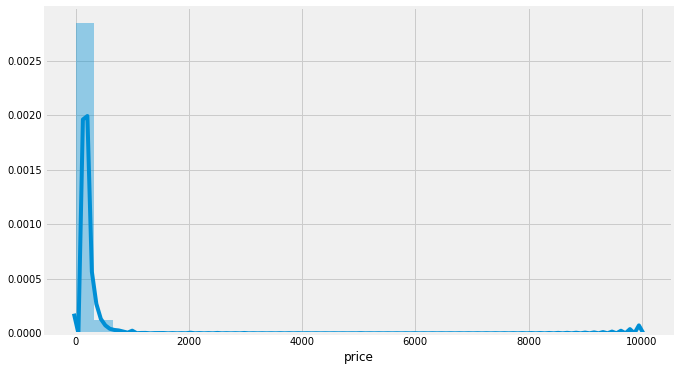

In [35]:
#Plot the distribution of MEDV
plt.figure(figsize=(10, 6))
sns.distplot(df['price'],bins=30)

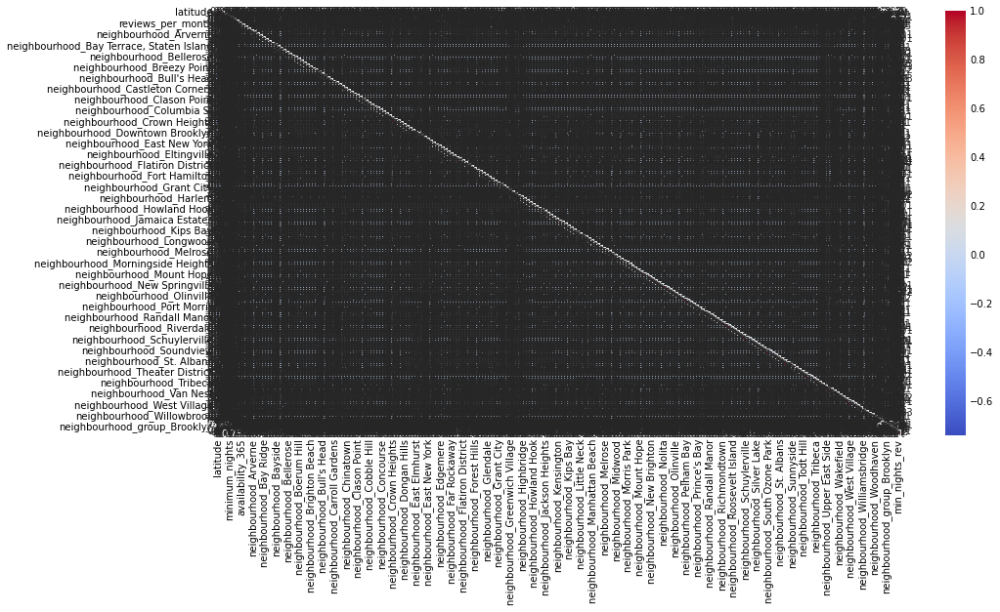

In [36]:
# Plot the correlation heatmap
plt.figure(figsize=(14, 8))
corr_matrix = df.corr().round(2)
sns.heatmap(data=corr_matrix,cmap='coolwarm',annot=True)

In [37]:
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x,y)
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
    rcorr = r-((r-1)**2)/(n-1)
    kcorr = k-((k-1)**2)/(n-1)
    return np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))

In [38]:
df_dummies.corr().style.background_gradient(cmap='coolwarm')

In [39]:
df.columns

Index(['latitude', 'longitude', 'room_type', 'price', 'minimum_nights',
       'number_of_reviews', 'last_review', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       ...
       'neighbourhood_Woodhaven', 'neighbourhood_Woodlawn',
       'neighbourhood_Woodside', 'neighbourhood_group_Bronx',
       'neighbourhood_group_Brooklyn', 'neighbourhood_group_Manhattan',
       'neighbourhood_group_Queens', 'neighbourhood_group_Staten Island',
       'min_nights_rev', 'min_number_of_reviews_categories'],
      dtype='object', length=235)

In [40]:
price_corr = df[df.columns[:]].corr()['price'][:]

In [ ]:
np.sort(price_corr)

In [42]:
df_corr = pd.DataFrame(df_dummies.corr())

In [43]:
df_corr = df_corr.price

In [45]:
df_corr.sort_values()[:]

longitude                          -0.16
neighbourhood_group_Brooklyn       -0.09
neighbourhood_group_Queens         -0.09
neighbourhood_Bushwick             -0.07
neighbourhood_Bedford-Stuyvesant   -0.05
                                    ... 
neighbourhood_Tribeca               0.09
neighbourhood_Midtown               0.10
neighbourhood_group_Manhattan       0.17
room_type                           0.28
price                               1.00
Name: price, Length: 234, dtype: float64

In [ ]:
df['neighbourhood_group'].value_counts()

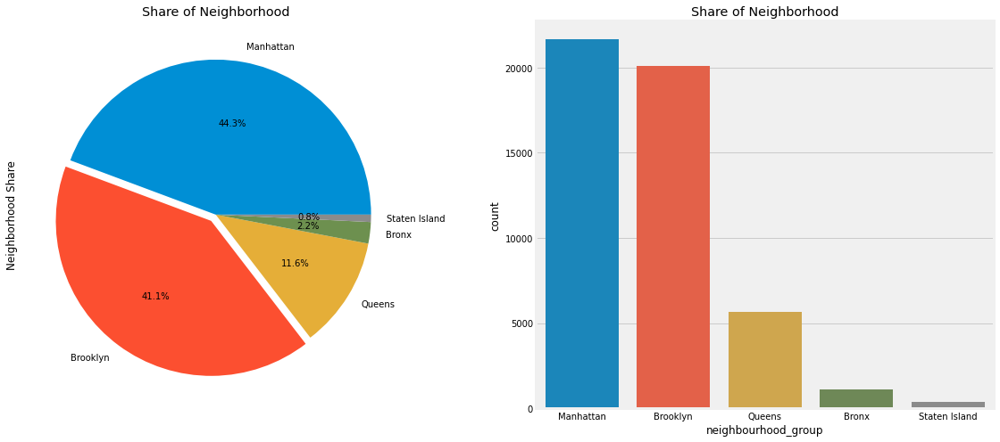

In [ ]:
f,ax=plt.subplots(1,2,figsize=(18,8))
df['neighbourhood_group'].value_counts().plot.pie(explode=[0,0.05,0,0,0],autopct='%1.1f%%',ax=ax[0],shadow=False)
ax[0].set_title('Share of Neighborhood')
ax[0].set_ylabel('Neighborhood Share')
sns.countplot('neighbourhood_group',data=df,ax=ax[1],order=df['neighbourhood_group'].value_counts().index)
ax[1].set_title('Share of Neighborhood')
plt.show()

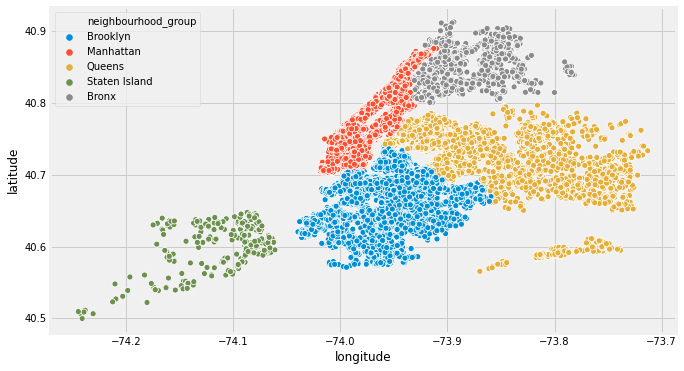

In [ ]:
plt.figure(figsize=(10,6))
sns.scatterplot(df.longitude,df.latitude,hue=df.neighbourhood_group)
plt.ioff()

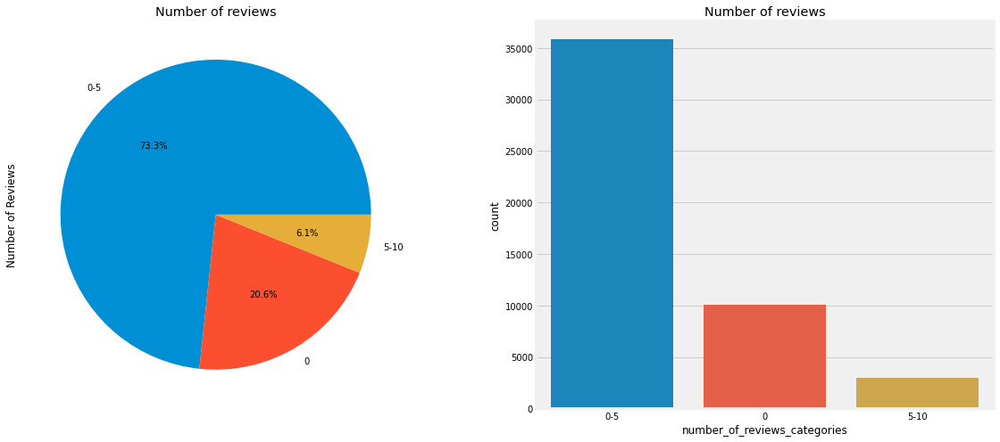

In [ ]:
f,ax=plt.subplots(1,2,figsize=(18,8))
df['number_of_reviews_categories'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=False)
ax[0].set_title('Number of reviews')
# not sure if we need the ylabel for the pie
ax[0].set_ylabel('Number of Reviews')
sns.countplot('number_of_reviews_categories',order=df['number_of_reviews_categories'].value_counts().index, data=df,ax=ax[1])
ax[1].set_title('Number of reviews')
plt.show()

# Models

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import r2_score

In [ ]:
#Defining the independent variables and dependent variables
x = df_dummies.iloc[:,3:]
y = df_dummies['price']
#Getting Test and Training Set
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.1,random_state=353)
x_train.head()
y_train.head()

17736    125
24351    101
10069    189
11679    145
16315    120
Name: price, dtype: int64

In [ ]:
reg=LinearRegression()
reg.fit(x_train,y_train)
y_pred=reg.predict(x_test)
from sklearn.metrics import r2_score
r2_score(y_test,y_pred)

1.0

In [ ]:
#Prepairng a Decision Tree Regression
from sklearn.tree import DecisionTreeRegressor
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.1,random_state=105)
DTree=DecisionTreeRegressor(min_samples_leaf=.0001)
DTree.fit(x_train,y_train)
y_predict=DTree.predict(x_test)
from sklearn.metrics import r2_score
r2_score(y_test,y_predict)

0.9958728884828707